Для более точного анализа тока смещения рассчитанного с помощью потенциала Лиенара-Вихерта необходимо учесть производную по времени от ускорения. В задаче Дробышева в момент времени ноль покоившийся ранее заряд мгновенно приобретает конечное ускорение. А в момент t0 этот заряд мгновенно теряет ускорение. В эти два момента производная по времени от ускорения терпит излом. Этот математический излом приводит к появлению поверхности разрыва в поле рассчитанного тока смещения.


Чтобы избавиться от этой математической проблемы, кроме момента времени ноль введём моменты времени t1,t2,t3 следующим образом. До момента ноль заряд как и раньше покоился. В момент ноль производная по времени от ускорения получает значение dot_a1 и это состояние продолжается в течение интервала между моментом ноль и моментом t1. В момент t1 производная по времени от ускорения обнуляется. Между моментами t1 и t2 производная по времени от ускорения нулевая. В момент t2 производная по времени от ускорения становится равной -dot_a2. И это значение держится постоянным в интервале между t2 и t3. После момента времени t3 производная по времени от ускорения нулевая.

In [1]:
dot_a1 = var("dot_a1")
dot_a2 = var("dot_a2")
t,t1,t2,t3 = var("t,t1,t2,t3")

Решим теперь кинематическую задачу вывода формул для ускорения, скорости и перемещения методом последовательных интегрирований в каждом из интервалов времени используя следующие несложные формулы

$a(t) = a(t_i) + \int\limits_{t_i}^{t} \dot a(t) \, dt$

$v(t) = v(t_i) + \int\limits_{t_i}^{t} a(t) \, dt$

$s(t) = s(t_i) + \int\limits_{t_i}^{t} v(t) \, dt$

In [2]:
tt    = [0, t1, t2, t3]
dot_a = [0, dot_a1, 0, -dot_a2, 0]

In [3]:
a = []
v = []
s = []
for i in range(len(tt)):
    dota = dot_a[i+1]

    ai = 0
    vi = 0
    si = 0

    if i > 0:
        ai = a[i-1].subs(t == tt[i])
    ai += integrate(dota, t, tt[i], t)
    a += [ai]
    print("time interval number", i)
    print("a =", ai)

    if i > 0:
        vi = v[i-1].subs(t == tt[i])
    vi += integrate(ai, t, tt[i], t)
    v += [vi]
    print("v =", vi)

    if i > 0:
        si = s[i-1].subs(t == tt[i])
    si += integrate(vi, t, tt[i], t)
    s += [si]
    print("s =",si)
    print("")

time interval number 0
a = dot_a1*t
v = 1/2*dot_a1*t^2
s = 1/6*dot_a1*t^3

time interval number 1
a = dot_a1*t1
v = dot_a1*(t - t1)*t1 + 1/2*dot_a1*t1^2
s = 1/2*dot_a1*t^2*t1 - 1/2*dot_a1*t*t1^2 + 1/6*dot_a1*t1^3

time interval number 2
a = -dot_a2*(t - t2) + dot_a1*t1
v = -1/2*dot_a2*t^2 + dot_a1*t*t1 - dot_a1*(t1 - t2)*t1 + 1/2*dot_a1*t1^2 + dot_a2*t*t2 - dot_a1*t1*t2 - 1/2*dot_a2*t2^2
s = -1/6*dot_a2*t^3 + 1/2*dot_a1*t^2*t1 - 1/2*dot_a1*t*t1^2 + 1/6*dot_a1*t1^3 + 1/2*dot_a2*t^2*t2 - 1/2*dot_a2*t*t2^2 + 1/6*dot_a2*t2^3

time interval number 3
a = dot_a1*t1 + dot_a2*(t2 - t3)
v = -dot_a1*(t1 - t2)*t1 + 1/2*dot_a1*t1^2 - dot_a1*t1*t2 - 1/2*dot_a2*t2^2 + dot_a1*t1*t3 + dot_a2*t2*t3 - 1/2*dot_a2*t3^2 + (dot_a1*t1 + dot_a2*(t2 - t3))*(t - t3)
s = 1/2*dot_a1*t^2*t1 - 1/2*dot_a1*t*t1^2 + 1/6*dot_a1*t1^3 + 1/2*dot_a2*t^2*t2 - 1/2*dot_a2*t*t2^2 + 1/6*dot_a2*t2^3 - 1/2*dot_a2*t^2*t3 - 1/2*dot_a1*t1^2*t3 - 1/2*dot_a2*t2^2*t3 + 1/2*dot_a2*t*t3^2 + 1/2*dot_a1*t1*t3^2 + 1/2*dot_a2*t2*t3^2 - 1/6*do

полученные таким образом формулы имплементируем внутри кусочно-нерперывных функций 

cdef long double s1x(long double t)

cdef long double v1x(long double t)

cdef long double w1x(long double t)

In [4]:
%%cython
cdef extern from "lw_drobyshev_task.c":
    # расчет итерациями запаздывающего момента
    int tlag(long double x, long double y, long double z, long double t, 
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double * pt2, long double * rlagerror)
    # отношение радиуса Лиенара Вихерта к радиусу
    int klw(long double x, long double y, long double z, long double t,
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double *pk, long double * rlagerror)
    # Радиус Лиенара Вихерта
    int Rlw(long double x, long double y, long double z, long double t,
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double *pRlw, long double * rlagerror)
    
    
    # phi_lw - скалярный потенциал Лиенара Вихерта
    int philw(long double x, long double y, long double z, long double t,
               long double (*Coordinate)(long double t_zap),
               long double (*Coordinate)(long double t_zap),
               long double (*Coordinate)(long double t_zap),
               long double (*Velocity)(long double t_zap),
               long double (*Velocity)(long double t_zap),
               long double (*Velocity)(long double t_zap),
               long double q,
               long double *pphi, long double * rlagerror)


    # A_lw - векторный потенциал Лиенара Вихерта
    int Alw(long double x, long double y, long double z, long double t,
             long double (*Coordinate)(long double t_zap),
             long double (*Coordinate)(long double t_zap),
             long double (*Coordinate)(long double t_zap),
             long double (*Velocity)(long double t_zap),
             long double (*Velocity)(long double t_zap),
             long double (*Velocity)(long double t_zap),
             long double q,
             long double * A_x, long double * A_y, long double * A_z,
             long double * rlagerror)
    
    int electr_magnet(long double x, long double y, long double z, long double t,
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Acceleration)(long double t_zap),
                long double (*Acceleration)(long double t_zap),
                long double (*Acceleration)(long double t_zap),
                long double q,
                long double * E_x, long double * E_y, long double * E_z,
                long double * B_x, long double * B_y, long double * B_z,
                long double * rlagerror)
    
    int electr_magnet_ex(long double x, long double y, long double z, long double t,
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Coordinate)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Velocity)(long double t_zap),
                long double (*Acceleration)(long double t_zap),
                long double (*Acceleration)(long double t_zap),
                long double (*Acceleration)(long double t_zap),
                      long double q,
                      long double * E_x, long double * E_y, long double * E_z,
                      long double * B_x, long double * B_y, long double * B_z,
                      long double * A_x, long double * A_y, long double * A_z,
                      long double * j_x, long double * j_y, long double * j_z,
                      long double * rlagerror)

    void set_c(long double _c)

cdef extern from "lw_drobyshev_task_n_charges_tensor.c":
    ctypedef long double (*Coordinate)( long double )
    ctypedef long double (*Velocity)( long double )
    ctypedef long double (*Acceleration)( long double )
    int spherical_x_ccalc_Maxwells_stress_tensor_R_t(long double xc,
        long double theta, long double varphi, long double t,
        int n_charges, long double q[],
        Coordinate sx[],
        Coordinate sy[],
        Coordinate sz[],
        Velocity vx[],
        Velocity vy[],
        Velocity vz[],
        Acceleration wx[],
        Acceleration wy[],
        Acceleration wz[],
        long double * pTxn, long double * pTyn, long double * pTzn,
        long double * pNx, long double * pNy, long double * pNz,
        long double * pSn,
        long double * pEn,
        long double * pHn,
        long double * pAn,
        long double * pJn,
        long double * sum_rlagerror_square)
    
    void cset_sphere_R(long double R);
    long double cget_sphere_R();

# Drobyshev's test
# Как запаздывающий Лиенар-Вихерт становится "незапаздывающим". Визуализация
# http://www.sciteclibrary.ru/cgi-bin/yabb2/YaBB.pl?num=1528093569/0

import numpy as np
cdef long double c = np.float128(1)
cdef long double vk = np.float128(0.84)   # finish velocity
cdef long double a = np.float128(0.3)     # acceleration
cdef long double t0 = vk/a                # time of acceleration
cdef long double dot_a1 = np.float128(10) # dot of acceleration
cdef long double t1 = a/dot_a1            # time of dot of acceleration
cdef long double t2 = t1 + t0
cdef long double t3 = t2 + t1
cdef long double dot_a2 = dot_a1

cdef long double s1x(long double t):
    cdef long double result
    if t < 0:
        result = 0
    elif t < t1: # s = 1/6*dot_a1*t^3
        result =      dot_a1*t*t*t/6.0
    elif t < t2: # s = 1/2*dot_a1*t^2*t1 - 1/2*dot_a1*t*t1^2 + 1/6*dot_a1*t1^3
        result =       dot_a1*t*t*t1/2   - dot_a1*t*t1*t1/2  + dot_a1*t1*t1*t1/6
    elif t < t3: # s = -1/6*dot_a2*t^3 + 1/2*dot_a1*t^2*t1 - 1/2*dot_a1*t*t1^2
                 #   + 1/6*dot_a1*t1^3 + 1/2*dot_a2*t^2*t2 - 1/2*dot_a2*t*t2^2
                 #   + 1/6*dot_a2*t2^3
        result =       -dot_a2*t*t*t/6 +   dot_a1*t*t*t1/2 - dot_a1*t*t1*t1/2 \
                     + dot_a1*t1*t1*t1/6 + dot_a2*t*t*t2/2   - dot_a2*t*t2*t2/2 \
                     + dot_a2*t2*t2*t2/6
    else:        # s = 1/2*dot_a1*t^2*t1 - 1/2*dot_a1*t*t1^2 + 1/6*dot_a1*t1^3
                 #   + 1/2*dot_a2*t^2*t2 - 1/2*dot_a2*t*t2^2 + 1/6*dot_a2*t2^3
                 #   - 1/2*dot_a2*t^2*t3 - 1/2*dot_a1*t1^2*t3 - 1/2*dot_a2*t2^2*t3
                 #   + 1/2*dot_a2*t*t3^2 + 1/2*dot_a1*t1*t3^2 + 1/2*dot_a2*t2*t3^2
                 #   - 1/6*dot_a2*t3^3 - 1/2*(dot_a1*t1 + dot_a2*t2)*t3^2
                 #   + 1/2*(dot_a1*t1^2 + dot_a2*t2^2)*t3
        result =        dot_a1*t*t*t1/2  - dot_a1*t*t1*t1/2 + dot_a1*t1*t1*t1/6 \
                      + dot_a2*t*t*t2/2  - dot_a2*t*t2*t2/2 + dot_a2*t2*t2*t2/6 \
                      - dot_a2*t*t*t3/2 - dot_a1*t1*t1*t3/2 - dot_a2*t2*t2*t3/2 \
                      + dot_a2*t*t3*t3/2 + dot_a1*t1*t3*t3/2 + dot_a2*t2*t3*t3/2 \
                      - dot_a2*t3*t3*t3/6 - (dot_a1*t1 + dot_a2*t2)*t3*t3/2 \
                      + (dot_a1*t1*t1 + dot_a2*t2*t2)*t3/2

    return result
cdef long double s2x(long double t):
    cdef long double result = -s1x(t)
    return result

cdef long double sy(long double t):
    cdef long double result
    result = 0
    return result
cdef long double sz(long double t):
    cdef long double result
    result = 0
    return result

cdef long double v1x(long double t):
    cdef long double result
    if t < 0:
        result = 0
    elif t < t1: # v = 1/2*dot_a1*t^2
        result =        dot_a1*t*t/2
    elif t < t2: # v = dot_a1*(t - t1)*t1 + 1/2*dot_a1*t1^2
        result =       dot_a1*(t - t1)*t1 + dot_a1*t1*t1/2
    elif t < t3: # v = -1/2*dot_a2*t^2 + dot_a1*t*t1 - dot_a1*(t1 - t2)*t1
                 #   + 1/2*dot_a1*t1^2 + dot_a2*t*t2 - dot_a1*t1*t2 - 1/2*dot_a2*t2^2
        result =       -dot_a2*t*t/2 + dot_a1*t*t1 - dot_a1*(t1 - t2)*t1 \
                      + dot_a1*t1*t1/2  + dot_a2*t*t2 - dot_a1*t1*t2 - dot_a2*t2*t2/2
    else:        # v = -dot_a1*(t1 - t2)*t1 + 1/2*dot_a1*t1^2 - dot_a1*t1*t2
                 #   - 1/2*dot_a2*t2^2 + dot_a1*t1*t3 + dot_a2*t2*t3 - 1/2*dot_a2*t3^2
                 #   + (dot_a1*t1 + dot_a2*(t2 - t3))*(t - t3)
        result =       -dot_a1*(t1 - t2)*t1 + dot_a1*t1*t1/2 - dot_a1*t1*t2 \
                      - dot_a2*t2*t2/2 + dot_a1*t1*t3 + dot_a2*t2*t3 - dot_a2*t3*t3/2 \
                      + (dot_a1*t1 + dot_a2*(t2 - t3))*(t - t3)

    return result
cdef long double v2x(long double t):
    cdef long double result = -v1x(t)
    return result
cdef long double vy(long double t):
    cdef long double result
    result = 0
    return result
cdef long double vz(long double t):
    cdef long double result
    result = 0
    return result


cdef long double w1x(long double t):
    cdef long double result
    if t < 0:
        result = 0
    elif t < t1: # a = dot_a1*t
        result =       dot_a1*t
    elif t < t2: # a = dot_a1*t1
        result =       dot_a1*t1
    elif t < t3: # a = -dot_a2*(t - t2) + dot_a1*t1
        result =       -dot_a2*(t - t2) + dot_a1*t1
    else:        # a = dot_a1*t1 + dot_a2*(t2 - t3)
        result =       dot_a1*t1 + dot_a2*(t2 - t3)
    return result
cdef long double w2x(long double t):
    cdef long double result = -w1x(t)
    return result
cdef long double wy(long double t):
    cdef long double result
    result = 0
    return result
cdef long double wz(long double t):
    cdef long double result
    result = 0
    return result

def R_lw(x, y, z, t):
    cdef long double Xa = x
    cdef long double Ya = y
    cdef long double Za = z
    cdef long double ta = t
    #print(x, y, z, t)
    #print(Xa, Ya, Za, ta)
    #print(sx(ta))
    set_c(1.0)
    cdef long double r_lw
    cdef long double rlagerror
    
    ret = Rlw(Xa, Ya, Za, ta, s1x, sy, sz, v1x, vy, vz, &r_lw, &rlagerror)

    return r_lw

def phi_lw(x, y, z, t, q):
    cdef long double Xa = x
    cdef long double Ya = y
    cdef long double Za = z
    cdef double ta = t
    set_c(1.0)
    cdef long double q_ = q
    #print(x, y, z, t)
    #print(Xa, Ya, Za, ta)
    #print(sx(ta))
    set_c(1.0)
    cdef long double phi1lw_
    cdef long double phi2lw_
    cdef long double rlagerror
    ret = philw(Xa, Ya, Za, ta, s1x, sy, sz, v1x, vy, vz, q_, &phi1lw_, &rlagerror)
    ret = philw(Xa, Ya, Za, ta, s2x, sy, sz, v2x, vy, vz, q_, &phi2lw_, &rlagerror)

    return phi1lw_ + phi2lw_


def A_lw(x, y, z, t, q):
    cdef long double Xa = x
    cdef long double Ya = y
    cdef long double Za = z
    cdef long double ta = t
    set_c(1.0)
    cdef long double q_ = q
    
    cdef long double A1_x
    cdef long double A1_y
    cdef long double A1_z

    cdef long double A2_x
    cdef long double A2_y
    cdef long double A2_z

    cdef long double rlagerror
    
    ret = Alw(Xa, Ya, Za, ta,
                  s1x, sy, sz, v1x, vy, vz,
                  q_,
                  &A1_x, &A1_y, &A1_z, &rlagerror)
    
    ret = Alw(Xa, Ya, Za, ta,
                  s2x, sy, sz, v2x, vy, vz,
                  q_,
                  &A2_x, &A2_y, &A2_z, &rlagerror)

    return (A1_x+A2_x, A1_y+A2_y, A1_z+A2_z)

def EBj_lw(x, y, z, t, q):
    cdef long double Xa = x
    cdef long double Ya = y
    cdef long double Za = z
    cdef long double ta = t
    set_c(1.0)
    cdef long double q_ = q
    
    cdef long double E1_x
    cdef long double E1_y
    cdef long double E1_z
    cdef long double B1_x
    cdef long double B1_y
    cdef long double B1_z
    cdef long double A1_x
    cdef long double A1_y
    cdef long double A1_z
    cdef long double j1_x
    cdef long double j1_y
    cdef long double j1_z
    
    cdef long double E2_x
    cdef long double E2_y
    cdef long double E2_z
    cdef long double B2_x
    cdef long double B2_y
    cdef long double B2_z
    cdef long double A2_x
    cdef long double A2_y
    cdef long double A2_z
    cdef long double j2_x
    cdef long double j2_y
    cdef long double j2_z

    cdef long double rlagerror

    ret = electr_magnet_ex(Xa, Ya, Za, ta,
                        s1x, sy, sz, v1x, vy, vz, w1x, wy, wz,
                        q_,
                        &E1_x, &E1_y, &E1_z,
                        &B1_x, &B1_y, &B1_z,
                        &A1_x, &A1_y, &A1_z,
                        &j1_x, &j1_y, &j1_z,
                        &rlagerror)

    ret = electr_magnet_ex(Xa, Ya, Za, ta,
                        s2x, sy, sz, v2x, vy, vz, w2x, wy, wz,
                        q_,
                        &E2_x, &E2_y, &E2_z,
                        &B2_x, &B2_y, &B2_z,
                        &A2_x, &A2_y, &A2_z,
                        &j2_x, &j2_y, &j2_z,
                        &rlagerror)

    return (E1_x+E2_x, E1_y+E2_y, E1_z+E2_z,
            B1_x+B2_x, B1_y+B2_y, B1_z+B2_z,
            j1_x+j2_x, j1_y+j2_y, j1_z+j2_z,
           )

def t_lag(x, y, z, t):
    cdef long double Xa = x
    cdef long double Ya = y
    cdef long double Za = z
    cdef long double ta = t
    set_c(1.0)
    cdef long double q = 1
    # расчет итерациями запаздывающего момента
    cdef long double lag
    cdef long double rlagerror
    
    ret = tlag(Xa, Ya, Za, ta, s1x, sy, sz, v1x, vy, vz, &lag, &rlagerror)
    return lag

def spherical_x_calc_En_R_t (xc, theta, varphi, t, to_throw=True) :
    cdef long double _xc = xc
    cdef long double _theta = theta
    cdef long double _varphi = varphi
    cdef long double _t = t

    cdef long double Txn
    cdef long double Tyn
    cdef long double Tzn
    cdef long double Nx
    cdef long double Ny
    cdef long double Nz
    cdef long double Sn
    cdef long double En
    cdef long double Hn
    cdef long double An
    cdef long double Jn
    
    cdef long double sum_rlagerror_square
    ret = spherical_x_ccalc_Maxwells_stress_tensor_R_t(_xc, _theta, _varphi, _t,
                2, [1.0,1.0],
                [s1x, s2x], [sy, sy], [sz, sz],
                [v1x, v2x], [vy, vy], [vz, vz],
                [w1x, w2x], [wy, wy], [wz, wz],
        &Txn,
        &Tyn,
        &Tzn,
        &Nx,
        &Ny,
        &Nz,
        &Sn,
        &En,
        &Hn,
        &An,
        &Jn,
        &sum_rlagerror_square)

    if (to_throw):
        if 0 != ret:
            print(ret, theta, varphi, t)
            raise Exception("Accuracy error")

        return np.float128(En)
    return np.float128(En), ret


def spherical_x_calc_Jn_R_t (xc, theta, varphi, t, to_throw=True) :
    cdef long double _xc = xc
    cdef long double _theta = theta
    cdef long double _varphi = varphi
    cdef long double _t = t

    cdef long double Txn
    cdef long double Tyn
    cdef long double Tzn
    cdef long double Nx
    cdef long double Ny
    cdef long double Nz
    cdef long double Sn
    cdef long double En
    cdef long double Hn
    cdef long double An
    cdef long double Jn
    
    cdef long double sum_rlagerror_square
    ret = spherical_x_ccalc_Maxwells_stress_tensor_R_t(_xc, _theta, _varphi, _t,
                2, [1.0,1.0],
                [s1x, s2x], [sy, sy], [sz, sz],
                [v1x, v2x], [vy, vy], [vz, vz],
                [w1x, w2x], [wy, wy], [wz, wz],
        &Txn,
        &Tyn,
        &Tzn,
        &Nx,
        &Ny,
        &Nz,
        &Sn,
        &En,
        &Hn,
        &An,
        &Jn,
        &sum_rlagerror_square)

    if (to_throw):
        if 0 != ret:
            print(ret, theta, varphi, t)
            raise Exception("Accuracy error")

        return np.float128(Jn)
    return np.float128(Jn), ret

def spherical_x_calc_Err_R_t (xc, theta, varphi, t, to_throw=True) :
    cdef long double _xc = xc
    cdef long double _theta = theta
    cdef long double _varphi = varphi
    cdef long double _t = t

    cdef long double Txn
    cdef long double Tyn
    cdef long double Tzn
    cdef long double Nx
    cdef long double Ny
    cdef long double Nz
    cdef long double Sn
    cdef long double En
    cdef long double Hn
    cdef long double An
    cdef long double Jn

    cdef long double sum_rlagerror_square
    ret = spherical_x_ccalc_Maxwells_stress_tensor_R_t(_xc, _theta, _varphi, _t,
                2, [1.0,1.0],
                [s1x, s2x], [sy, sy], [sz, sz],
                [v1x, v2x], [vy, vy], [vz, vz],
                [w1x, w2x], [wy, wy], [wz, wz],
        &Txn,
        &Tyn,
        &Tzn,
        &Nx,
        &Ny,
        &Nz,
        &Sn,
        &En,
        &Hn,
        &An,
        &Jn,
        &sum_rlagerror_square)

    if (to_throw):
        if 0 != ret:
            print(ret, theta, varphi, t)
            raise Exception("Accuracy error")

        return cget_sphere_R()*cget_sphere_R()*np.sin(theta)*np.float128(sum_rlagerror_square)
    return np.float128(sum_rlagerror_square), ret


def set_sphere_R(R):
    cset_sphere_R(R)
def get_sphere_R():
    return cget_sphere_R()

def get_s1x(t):
    cdef long double _t = t
    cdef long double result = s1x(_t)
    return result
    

In [5]:
def make_R(t_cur):
    xa_linspace = np.linspace(np.float64(-10), np.float64(+10), 30*4)
    ya_linspace = np.linspace(np.float64(-10), np.float64(+10), 20*4)

    xa_list = xa_linspace.tolist()
    ya_list = ya_linspace.tolist()

    xa_grid,ya_grid = np.meshgrid(xa_linspace, ya_linspace)

    u_ = xa_grid * np.nan
    v_ = ya_grid * np.nan
    e_ = xa_grid * np.nan

    t_ = ya_grid * np.nan
    rlw_ = ya_grid * np.nan
    s_ = ya_grid * np.nan
    bz_ = ya_grid * np.nan

    ax_ = ya_grid * np.nan

    sx_ = ya_grid * np.nan
    sy_ = ya_grid * np.nan
    sz_ = ya_grid * np.nan

    bz_min = +np.finfo(np.float64).max
    bz_max = -np.finfo(np.float64).max

    sx_min = +np.finfo(np.float64).max
    sx_max = -np.finfo(np.float64).max

    sy_min = +np.finfo(np.float64).max
    sy_max = -np.finfo(np.float64).max
    
    jx_ = ya_grid * np.nan
    jy_ = ya_grid * np.nan
    jz_ = ya_grid * np.nan
    je_ = ya_grid * np.nan


    q = 1


    for ix in np.arange(0, len(xa_linspace), 1):
        for iy in np.arange(0, len(ya_linspace), 1):

            Xa = xa_list[ix]
            Ya = ya_list[iy]
            Za = 0.0
            R = R_lw(Xa, Ya, Za, t_cur)
            rlw_[iy][ix] = R

            (E_x, E_y, E_z, B_x, B_y, B_z, j_x, j_y, j_z) = EBj_lw(Xa, Ya, Za, t_cur, q)
            (A_x, A_y, A_z) = A_lw(Xa, Ya, Za, t_cur, q)
            # The Poynting vector S is defined as to be equal
            # to the cross product (1/μ)E × B
            S_x = E_y * B_z - E_z * B_y
            S_y = E_z * B_x - E_x * B_z
            S_z = E_x * B_y - E_y * B_x
            sx_[iy][ix] = S_x
            sy_[iy][ix] = S_y
            sz_[iy][ix] = S_z

            ax_[iy][ix] = A_x

            if sx_min > S_x:
                sx_min = S_x
            if sx_max < S_x:
                sx_max = S_x        

            if sy_min > S_y:
                sy_min = S_y
            if sy_max < S_y:
                sy_max = S_y


            u_[iy][ix] = E_x
            v_[iy][ix] = E_y
            e_[iy][ix] = sqrt(E_x*E_x + E_y*E_y)

            t2 = t_lag(Xa, Ya, 0, t_cur)
            t_[iy][ix] = t2

            jx_[iy][ix] = j_x
            jy_[iy][ix] = j_y
            jz_[iy][ix] = j_z
            je_[iy][ix] = sqrt(j_x*j_x + j_y*j_y)

            phi_ = phi_lw(Xa, Ya, 0, t_cur, q)
            s_[iy][ix] = phi_
            bz_[iy][ix] = B_z
            if bz_min > B_z:
                bz_min = B_z
            if bz_max < B_z:
                bz_max = B_z
    return xa_grid,ya_grid, u_,v_,e_,t_, rlw_, s_, ax_, bz_, sx_, sy_, jx_, jy_, je_

In [6]:
%time (xa_grid, ya_grid, u_,v_,e_, t_, rlw_, s_, ax_, bz_, sx_, sy_, jx_, jy_, je_) \
    = make_R(t_cur = 7.5)

CPU times: user 220 ms, sys: 16 µs, total: 220 ms
Wall time: 394 ms


In [7]:
import matplotlib.pyplot as plt
from matplotlib import ticker, cm

def plot_lw(xa_grid, ya_grid, lw, title, levels=None):
    fig,ax=plt.subplots(1,1)
    cp = ax.contourf(xa_grid, ya_grid, lw, levels=levels)
    fig.colorbar(cp) # Add a colorbar to a plot
    ax.set_title(title)
    ax.set_xlabel('x (cm)')
    ax.set_ylabel('y (cm)')
    ax.set_aspect(1)
    return plt

In [8]:
def plot_e(xa_grid, ya_grid, e, u, v, R, title, levels=None):
    fig,ax=plt.subplots(1,1)
    cp = ax.contourf(xa_grid, ya_grid, e, levels=levels)
    fig.colorbar(cp) # Add a colorbar to a plot
    ax.set_title(title)
    ax.set_xlabel('x (cm)')
    ax.set_ylabel('y (cm)')
    ax.set_aspect(1)
    
    circle = plt.Circle((0, 0), R, color='b', fill=False)
    ax.add_patch(circle)
    
    plt.streamplot(xa_grid,ya_grid, u, v, density=0.75,
               linewidth=0.5, color="red",
               cmap=None, norm=None,
               arrowsize=1,
               arrowstyle='-|>',
               minlength=0.1,
               transform=None, zorder=None,
               start_points=None, maxlength=1.0,
               integration_direction='both')

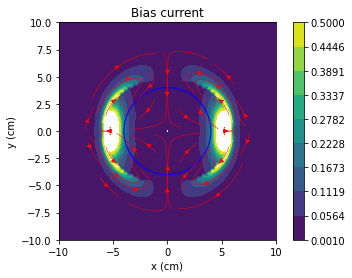

In [9]:
levels = np.linspace(0.001, 0.5, 10)
plot_e(xa_grid, ya_grid, e=e_, u=jx_, v=jy_, R=4, title='Bias current',
    levels = levels)

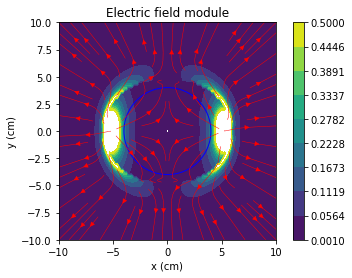

In [10]:
levels = np.linspace(0.001, 0.5, 10)
plot_e(xa_grid, ya_grid, e=e_, u=u_, v=v_, R=4, title='Electric field module',
    levels = levels)

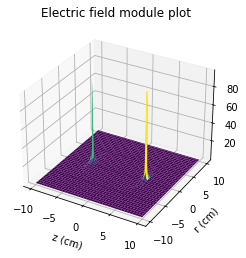

In [11]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
fig = plt.figure()

ax = plt.axes(projection='3d')
ax.set_xlabel('z (cm)')
ax.set_ylabel('r (cm)')
ax.plot_surface(xa_grid,ya_grid, e_, cmap='viridis', edgecolor='none')
ax.set_title('Electric field module plot')
plt.show()

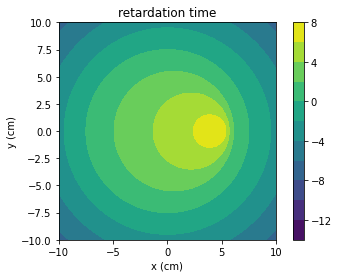

In [12]:
fig,ax=plt.subplots(1,1)
cp = ax.contourf(xa_grid,ya_grid, t_, levels = np.linspace(-14, 8, 22/2+1))
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('retardation time')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
ax.set_aspect(1)
plt.show()

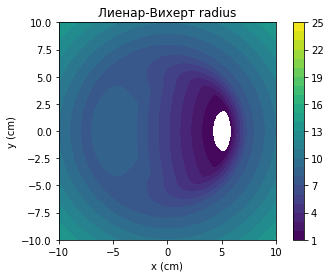

In [13]:
fig,ax=plt.subplots(1,1)
cp = ax.contourf(xa_grid,ya_grid, rlw_, levels = np.linspace(1, 25, 24/1+1))
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('Лиенар-Вихерт radius')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
ax.set_aspect(1)
plt.show()

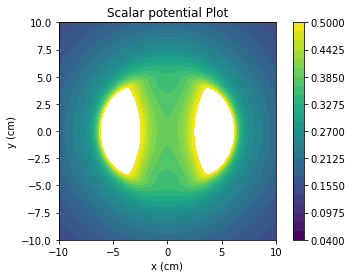

In [14]:
fig,ax=plt.subplots(1,1)
cp = ax.contourf(xa_grid,ya_grid, s_, levels = np.linspace(0.04, 0.5, int((1-0.04)/0.04+1)))
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('Scalar potential Plot')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
ax.set_aspect(1)
plt.show()

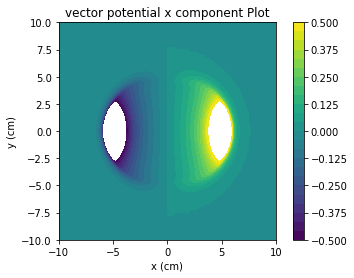

In [15]:
fig,ax=plt.subplots(1,1)
cp = ax.contourf(xa_grid,ya_grid, ax_, levels = np.linspace(-0.5, 0.5, int((1-0.04)/0.04+1)))
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('vector potential x component Plot')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
ax.set_aspect(1)
plt.show()

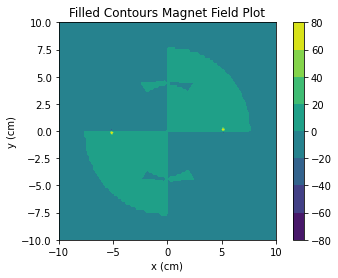

In [16]:
fig,ax=plt.subplots(1,1)
cp = ax.contourf(xa_grid,ya_grid, bz_, levels = None)
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('Filled Contours Magnet Field Plot')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
ax.set_aspect(1)
plt.show()

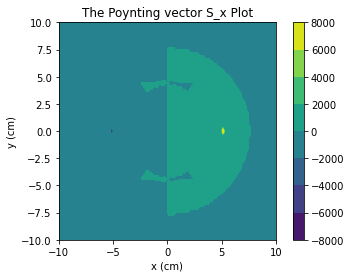

In [17]:
fig,ax=plt.subplots(1,1)
cp = ax.contourf(xa_grid,ya_grid, sx_, levels = None)
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('The Poynting vector S_x Plot')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
ax.set_aspect(1)
plt.show()

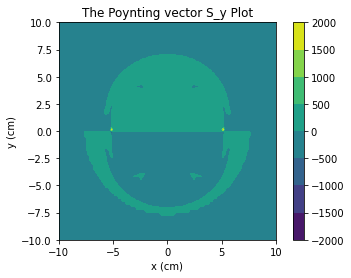

In [18]:
fig,ax=plt.subplots(1,1)
cp = ax.contourf(xa_grid,ya_grid, sy_, levels = None)
fig.colorbar(cp) # Add a colorbar to a plot
ax.set_title('The Poynting vector S_y Plot')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
ax.set_aspect(1)
plt.show()

In [19]:
# радиус сферы интегрирования
R = 4

set_sphere_R(R)

get_sphere_R(), R, R^2

(4.0, 4, 16)

In [20]:
from scipy import integrate as scipy_integrate

En_x_t = lambda t : scipy_integrate.nquad( \
    lambda theta, varphi : 
    spherical_x_calc_En_R_t(xc = get_sx(t),
        theta = theta, varphi = varphi, t = t), \
    [ [0, np.float128(pi)],  [0, np.float128(2*pi)]])
#            theta,             varphi

In [21]:
En_x_t = lambda ti : scipy_integrate.nquad( \
    lambda theta, varphi : 
    spherical_x_calc_En_R_t(xc = 0,
        theta = theta, varphi = varphi, t = ti), \
    [ [0, np.float128(pi)],  [0, np.float128(2*pi)]])
#            theta,             varphi

In [22]:
Jn_x_t = lambda ti : scipy_integrate.nquad( \
    lambda theta, varphi : 
    spherical_x_calc_Jn_R_t(xc = 0,
        theta = theta, varphi = varphi, t = ti), \
    [ [0, np.float128(pi)],  [0, np.float128(2*pi)]])
#            theta,             varphi

In [23]:
En_x_theta = lambda theta, ti : scipy_integrate.nquad( \
    lambda  varphi : 
    spherical_x_calc_En_R_t(xc = 0,
        theta = theta, varphi = varphi, t = ti), \
    [ [0, np.float128(2*pi)]])
#            theta,             varphi

In [24]:
Jn_x_theta = lambda theta, ti : scipy_integrate.nquad( \
    lambda  varphi : 
    spherical_x_calc_Jn_R_t(xc = 0,
        theta = theta, varphi = varphi, t = ti), \
    [ [0, np.float128(2*pi)]])
#            theta,             varphi

In [25]:
x_intEn = []
x_intJn = []
for ti in np.arange(0.00, 20, 0.1):
    int_En = (En_x_t(ti)[0]/(4*pi)).n()
    int_Jn = (Jn_x_t(ti)[0]/(4*pi)).n()
    #print(ti, get_sx(ti), "%0.36e" % (int_En))
    x_intEn += [(get_s1x(ti), int_En)]
    x_intJn += [(get_s1x(ti), int_Jn)]

/usr3/articles/sagemath_docker_build/sage/local/lib/python3.10/site-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


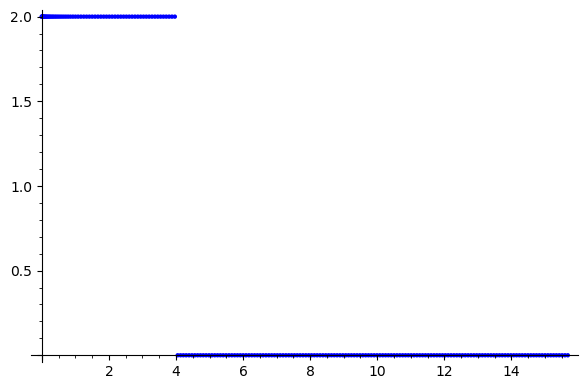

In [26]:
list_plot(x_intEn)

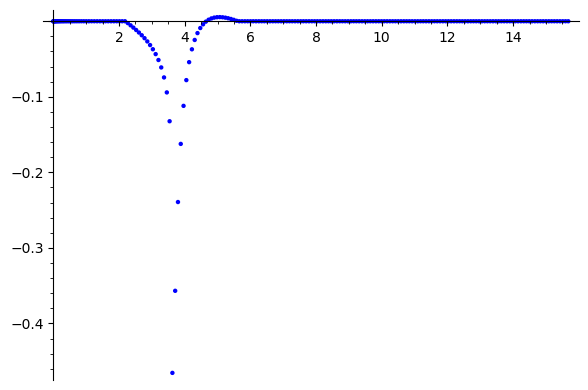

In [27]:
list_plot(x_intJn)

In [28]:
theta_x_steps_number = 360            # разбиваем период на шаги
dtheta_x = pi / theta_x_steps_number  # длительность шага

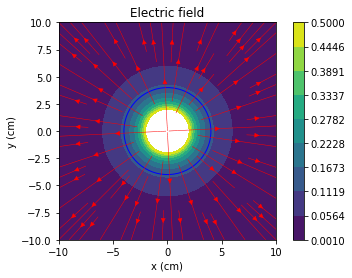

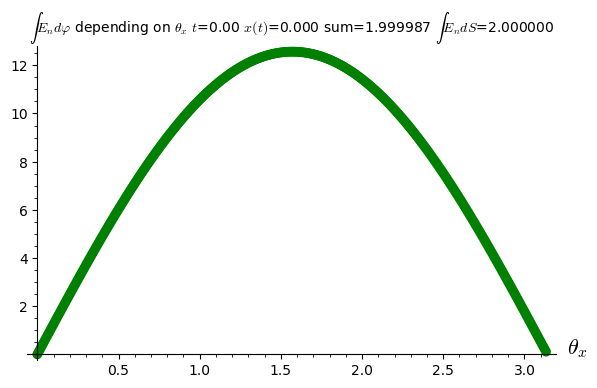

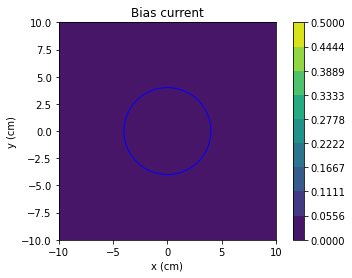

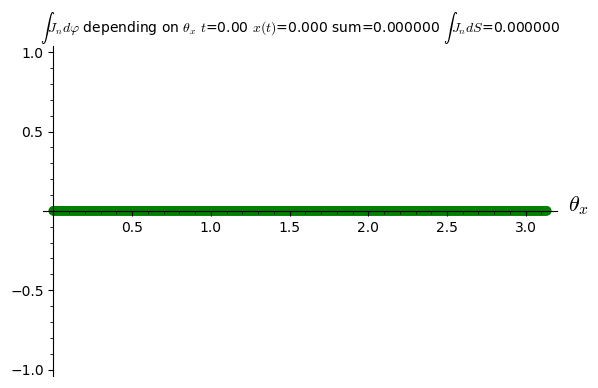

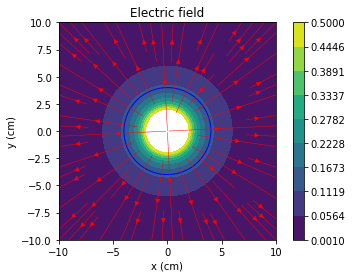

...

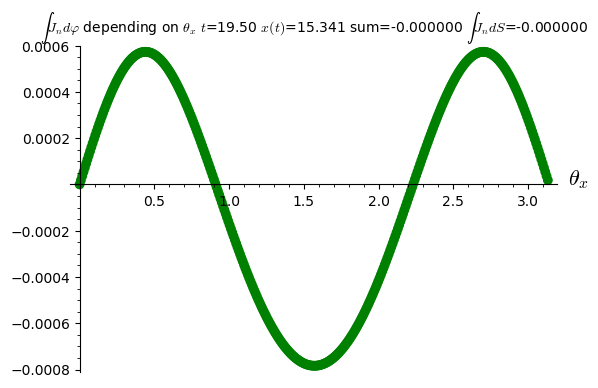

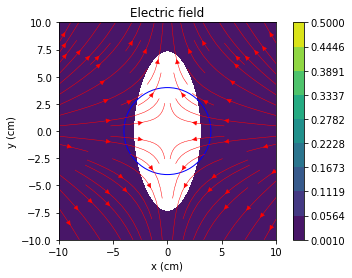

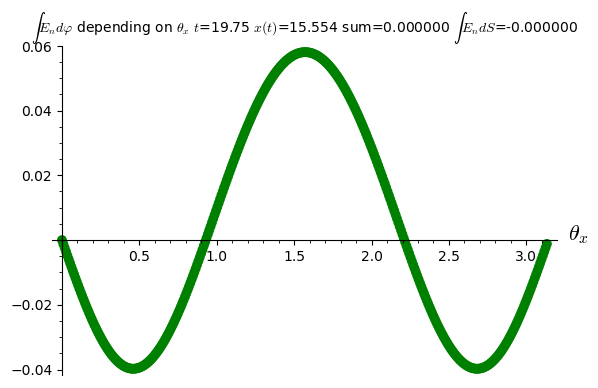

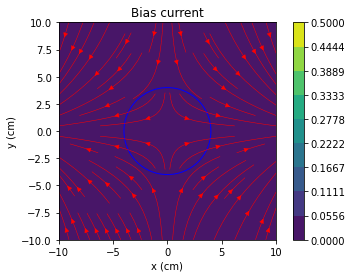

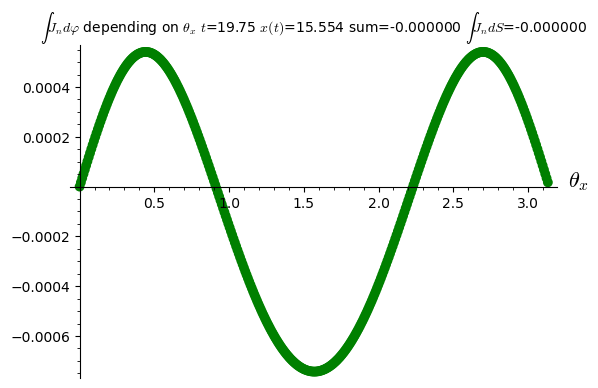

In [29]:
for ti in np.arange(0.00, 20, 0.25):

    int_En = (En_x_t(ti)[0]/(4*pi)).n()    
    int_Jn = (Jn_x_t(ti)[0]/(4*pi)).n()    

    theta_x_En_x = []
    theta_x_Jn_x = []
    intsum_En = 0.0
    intsum_Jn = 0.0
    for i in range(0, theta_x_steps_number):
        theta_x_i = i * dtheta_x
        en_x = En_x_theta(theta_x_i, ti)
        jn_x = Jn_x_theta(theta_x_i, ti)
        #print(theta_x_i, poyting_x)
        theta_x_En_x += [(theta_x_i, en_x[0])]
        theta_x_Jn_x += [(theta_x_i, jn_x[0])]
        intsum_En += dtheta_x * en_x[0]
        intsum_Jn += dtheta_x * jn_x[0]

    intsum_En /= (4*pi).n()
    intsum_Jn /= (4*pi).n()

    (xa_grid, ya_grid, u_,v_,e_, t_, rlw_, s_, ax_, bz_, sx_, sy_, jx_, jy_, je_) \
        = make_R(t_cur = ti)
    levels = np.linspace(0.001, 0.5, 10)
    plot_e(xa_grid, ya_grid, e=e_, u=u_, v=v_, R=R, title='Electric field',
        levels = levels)
    plt.show()

    p  = list_plot(theta_x_En_x, color="green", pointsize=50)
    #p += plot(get_omega()^4 * get_R_r()^2 * sin(x)^3/(get_c()^3),x,0,pi, color="blue")
    p.show(title="$\\int E_n d\\varphi$ depending on $\\theta_x$"
           " $t$=%0.2f $x(t)$=%0.3f sum=%f $\\int E_n dS$=%f"
           % (ti, get_s1x(ti), intsum_En, int_En),
          axes_labels=["$\\theta_x$", ""])

    levels = np.linspace(0.0, 0.5, 10)
    plot_e(xa_grid, ya_grid, e=je_, u=jx_, v=jy_, R=4, title='Bias current',
        levels = levels)
    plt.show()

    p  = list_plot(theta_x_Jn_x, color="green", pointsize=50)
    p.show(title="$\\int J_n d\\varphi$ depending on $\\theta_x$"
           " $t$=%0.2f $x(t)$=%0.3f sum=%f $\\int J_n dS$=%f"
           % (ti, get_s1x(ti), intsum_Jn, int_Jn),
          axes_labels=["$\\theta_x$", ""])
